# Part 1 – Data Preparation and Preprocessing. [15points]

## 1. Describe the dataset. (8 points)

In [1]:
import pandas as pd

df = pd.read_csv('data.csv')

C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\546824446.py:3: DtypeWarning: Columns (0,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data.csv')


> Describe the dataset (e.g.: type of column, value range). (1 point)

In [2]:
# Check the number of rows and columns in the dataset
df.shape

(318477, 13)

In [3]:
# View the column names
df.columns

Index(['Id', 'Title', 'Company', 'Date', 'Location', 'Area', 'Classification',
       'SubClassification', 'Requirement', 'FullDescription', 'LowestSalary',
       'HighestSalary', 'JobType'],
      dtype='object')

In [4]:
# Check the data type of each column
df.dtypes

Id                   object
Title                object
Company              object
Date                 object
Location             object
Area                 object
Classification       object
SubClassification    object
Requirement          object
FullDescription      object
LowestSalary          int64
HighestSalary         int64
JobType              object
dtype: object

In [5]:
# Check the summary statistics of the numerical columns
df.describe()

,LowestSalary,HighestSalary
count,318477.000000,318477.000000
mean,65.813544,114.432342
std,51.063125,177.594941
min,0.000000,30.000000
25%,30.000000,40.000000
50%,60.000000,70.000000
75%,100.000000,120.000000
max,200.000000,999.000000


In [6]:
# Check the unique values in each categorical column

print(df['Id'].nunique())
print(df['Title'].nunique())
print(df['Company'].nunique())
print(df['Date'].nunique())
print(df['Location'].nunique())
print(df['Area'].nunique())
print(df['Classification'].nunique())
print(df['SubClassification'].nunique())
print(df['Requirement'].nunique())
print(df['FullDescription'].nunique())
print(df['LowestSalary'].nunique())
print(df['HighestSalary'].nunique())
print(df['JobType'].nunique())

318477
168065
40628
163
65
19
30
338
234287
250901
11
11
4


> How many records are there in the dataset? (1 point)

In [7]:
print("Number of records:", df.shape[0])

Number of records: 318477


> How many locations does the dataset have? Which location has the most job
postings? (1 point)

In [8]:
# Count the number of unique locations
num_locations = df['Location'].nunique()
print("Number of unique locations:", num_locations)

# Count the number of job postings for each location
job_counts = df['Location'].value_counts()

# Print the location with the most job postings
most_postings = job_counts.index[0]
print("Location with the most job postings:", most_postings, "({} postings)".format(job_counts[most_postings]))

Number of unique locations: 65
Location with the most job postings: Sydney (60765 postings)


> How many job sectors(job classifications) are there in the dataset? List the name of
each sector and its’ total of job postings. (1 point)

In [9]:
# Count the number of unique job classifications
num_classifications = df['Classification'].nunique()
print("Number of unique job classifications:", num_classifications)

# Count the number of job postings for each classification
job_counts = df['Classification'].value_counts()

# Print the name of each classification and its job count
for i in range(len(job_counts)):
    classification = job_counts.index[i]
    count = job_counts[classification]
    print("{:25s} {:d}".format(classification, count))


Number of unique job classifications: 30
Information & Communication Technology 22796
Trades & Services         17976
Healthcare & Medical      17085
Hospitality & Tourism     15523
Manufacturing, Transport & Logistics 12376
Administration & Office Support 10020
Accounting                9368
Education & Training      9280
Construction              8372
Sales                     8119
Retail & Consumer Products 8041
Government & Defence      7443
Engineering               6458
Mining, Resources & Energy 6288
Banking & Financial Services 4633
Community Services & Development 4485
Legal                     4237
Human Resources & Recruitment 4144
Call Centre & Customer Service 3971
Marketing & Communications 3968
Real Estate & Property    3614
Design & Architecture     1811
Insurance & Superannuation 1474
Consulting & Strategy     1206
Sport & Recreation        984
Science & Technology      905
Farming, Animals & Conservation 882
CEO & General Management  844
Advertising, Arts & Media 833


> Choose your favorite job sector (e.g. Information & Communication Technology),
how many sub-sectors are there in that sector? List the name of each sub-sector and
its’ job posting number. (1 point)

In [10]:
# Choose the job sector of interest
sector = "Information & Communication Technology"

# Count the number of unique sub-classifications for the chosen sector
num_subclass = df[df['Classification'] == sector]['SubClassification'].nunique()
print("Number of unique sub-sectors in {}: {}".format(sector, num_subclass))

# Count the number of job postings for each sub-classification
job_counts = df[df['Classification'] == sector]['SubClassification'].value_counts()

# Print the name of each sub-classification and its job count
for i in range(len(job_counts)):
    subclass = job_counts.index[i]
    count = job_counts[subclass]
    print("{:30s} {:d}".format(subclass, count))

Number of unique sub-sectors in Information & Communication Technology: 22
Developers/Programmers         4211
Business/Systems Analysts      2986
Programme & Project Management 2413
Architects                     1548
Engineering - Software         1437
Help Desk & IT Support         1374
Networks & Systems Administration 1194
Consultants                    1149
Other                          997
Testing & Quality Assurance    831
Security                       774
Management                     746
Engineering - Network          552
Database Development & Administration 551
Web Development & Production   452
Sales - Pre & Post             449
Product Management & Development 376
Telecommunications             357
Team Leaders                   173
Engineering - Hardware         116
Technical Writing              97
Computer Operators             13


> List the salary ranges and their total of job postings. (1 point)

In [11]:
# Group the job postings by salary range and count the number of job postings in each group
salary_counts = df.groupby(['LowestSalary', 'HighestSalary']).size()

# Print the salary range and its corresponding job count
for i in range(len(salary_counts)):
    salary_range = salary_counts.index[i]
    count = salary_counts[salary_range]
    print("Salary range: {:d}-{:d}, job count: {:d}".format(salary_range[0], salary_range[1], count))

Salary range: 0-30, job count: 62639
Salary range: 30-40, job count: 23476
Salary range: 40-50, job count: 34436
Salary range: 50-60, job count: 27027
Salary range: 60-70, job count: 28499
Salary range: 70-80, job count: 28712
Salary range: 80-100, job count: 24249
Salary range: 100-120, job count: 27673
Salary range: 120-150, job count: 24514
Salary range: 150-200, job count: 25841
Salary range: 200-999, job count: 11411


> List the job types. In each job type, what are the lowest salary and highest salary? (1
point)

In [12]:
# Group the job postings by job type and compute the minimum and maximum salary for each group
job_type_salaries = df.groupby('JobType').agg({'LowestSalary': 'min', 'HighestSalary': 'max'})

# Print the job type, the lowest salary, and the highest salary for each group
for i in range(len(job_type_salaries)):
    job_type = job_type_salaries.index[i]
    lowest_salary = job_type_salaries.iloc[i]['LowestSalary']
    highest_salary = job_type_salaries.iloc[i]['HighestSalary']
    print("Job type: {:s}, lowest salary: {:d}, highest salary: {:d}".format(job_type, lowest_salary, highest_salary))

Job type: Casual/Vacation, lowest salary: 0, highest salary: 999
Job type: Contract/Temp, lowest salary: 0, highest salary: 999
Job type: Full Time, lowest salary: 0, highest salary: 999
Job type: Part Time, lowest salary: 0, highest salary: 999


## 2. Normalize and clean data. (7 points)

> The salaries are kept in the dataset as “HighestSalary” and “LowestSalary”. You
should calculate the “AverageSalary” for each job. (1 point)

In [13]:
# Create a new column in the DataFrame that contains the average of the 'HighestSalary' and 'LowestSalary' columns
df['AverageSalary'] = (df['HighestSalary'] + df['LowestSalary']) / 2

# Group the job postings by job title and compute the average salary for each group
job_title_salaries = df.groupby('Title').agg({'AverageSalary': 'mean'})

# Print the job title and the average salary for each group
for i in range(len(job_title_salaries)):
    job_title = job_title_salaries.index[i]
    avg_salary = job_title_salaries.iloc[i]['AverageSalary']
    print("Job title: {:s}, average salary: {:.2f}".format(job_title, avg_salary))

Job title:                                           Laboratory Sales Specialist, average salary: 135.00
Job title:     General Entry Meat Process Worker - Hemmant, average salary: 35.00
Job title:   Data Integration Consultants - Dell Boomi Experts  , average salary: 110.00
Job title:   SAP Administrator, average salary: 55.00
Job title:  .Net/ Umbraco Developer, average salary: 65.00
Job title:  1st Year Apprentice - Engineering Mechanical Trade , average salary: 35.00
Job title:  2 x Senior Business Analyst - Capital Markets/Trading , average salary: 135.00
Job title:  2nd or 3rd year Electrical Apprenticeship, average salary: 35.00
Job title:  Account Manager, average salary: 90.00
Job title:  Accounts Payable Officer, average salary: 15.00
Job title:  Administration Assistant, average salary: 55.00
Job title:  Administration Assistant , average salary: 45.00
Job title:  Administrative Services Officer, Legal Help, average salary: 45.00
Job title:  Adult ICU Registered Nurse - Hoba

Job title: Admin and Finance Support Officer, average salary: 45.00
Job title: Admin and Marketing Coordinator, average salary: 15.00
Job title: Admin and Project Support, average salary: 45.00
Job title: Admin and Reception, average salary: 55.00
Job title: Admin and Rostering Officer, average salary: 55.00
Job title: Admin and Sales PA, Real Estate $70k Package CBD, average salary: 75.00
Job title: Admin and Sales Support, average salary: 15.00
Job title: Admin and Service Assistant, average salary: 45.00
Job title: Admin and Settlements , average salary: 65.00
Job title: Admin and Workload Scheduling, average salary: 35.00
Job title: Admin assistant, average salary: 65.00
Job title: Admin assistant - Construction Industry, average salary: 45.00
Job title: Admin assistant- Book keeping, average salary: 55.00
Job title: Admin assistant/SAP role at DERRIMUT location, average salary: 65.00
Job title: Admin assistant/receptionist, average salary: 35.00
Job title: Admin office Support, av

Job title: Associate Professor of Economics, average salary: 135.00
Job title: Associate Professor or Professor (Finance), average salary: 135.00
Job title: Associate Professor or Senior Lecturer in Veterinary Pathology, average salary: 135.00
Job title: Associate Professor, Computer Science, average salary: 135.00
Job title: Associate Professor, Construction Management, average salary: 95.00
Job title: Associate Professor, Electrical and Electronics, average salary: 175.00
Job title: Associate Professor, French and Francophone Studies, average salary: 75.00
Job title: Associate Professor, Health Services Research - Allied Health, average salary: 15.00
Job title: Associate Professor, Transforming Learning, average salary: 175.00
Job title: Associate Professor/ Professor in Maori Education, average salary: 175.00
Job title: Associate Professor/ Senior Research Fellow – Precision Healthcare, average salary: 175.00
Job title: Associate Professor/Professor, average salary: 165.00
Job title

Job title: Branch Manager - Timber Sales, average salary: 75.00
Job title: Branch Manager - Toowoomba, average salary: 75.00
Job title: Branch Manager - Townsville, average salary: 75.00
Job title: Branch Manager - Victoria, average salary: 131.67
Job title: Branch Manager - Western Sydney , average salary: 15.00
Job title: Branch Manager - Wholesale Electrical, average salary: 110.00
Job title: Branch Manager - Whyalla, average salary: 15.00
Job title: Branch Manager - Wollongong - 12 month contract, average salary: 110.00
Job title: Branch Manager - WorkCare, average salary: 75.00
Job title: Branch Manager / Operations Manager - Sydney, average salary: 135.00
Job title: Branch Manager / Service Manager, average salary: 75.00
Job title: Branch Manager Automotive, average salary: 15.00
Job title: Branch Manager Brisbane, average salary: 45.00
Job title: Branch Manager Broome, average salary: 90.00
Job title: Branch Manager Flight Standards, average salary: 175.00
Job title: Branch Mana

Job title: CNC Machinist Reuired !, average salary: 15.00
Job title: CNC Machinist WANTED!!, average salary: 75.00
Job title: CNC Machinist and Programmer - Brisbane, average salary: 75.00
Job title: CNC Machinist | Afternoon Shift, average salary: 15.00
Job title: CNC Machinist | Afternoon Shift Supervisor, average salary: 90.00
Job title: CNC Machinist | Lathe Experience | $35 per hour flat rate, average salary: 65.00
Job title: CNC Machinist | Programmer, average salary: 65.00
Job title: CNC Machinist | Programmer Mazak, average salary: 65.00
Job title: CNC Machinist, Fitter, Mechanical, Port Hedland, average salary: 75.00
Job title: CNC Machinist/Programmer, average salary: 46.67
Job title: CNC Machinists, average salary: 71.00
Job title: CNC Machinists - Night Shift, average salary: 110.00
Job title: CNC Machinists Needed - Global Mining Company, average salary: 90.00
Job title: CNC Milling Machinist, average salary: 35.00
Job title: CNC Milling Programmer / Operator, average sala

Job title: Casual Cook in Ramsgate, average salary: 35.00
Job title: Casual Cook in Ramsgate Beach, average salary: 35.00
Job title: Casual Cook in Randwick, average salary: 33.57
Job title: Casual Cook in Raymond Terrace, average salary: 35.00
Job title: Casual Cook in Red Hill, average salary: 28.33
Job title: Casual Cook in Redhead, average salary: 35.00
Job title: Casual Cook in Richmond, average salary: 31.67
Job title: Casual Cook in Ringwood, average salary: 15.00
Job title: Casual Cook in Ripplebrook, average salary: 35.00
Job title: Casual Cook in Riverwood, average salary: 45.00
Job title: Casual Cook in Robina, average salary: 35.00
Job title: Casual Cook in Rochedale South, average salary: 15.00
Job title: Casual Cook in Rockdale, average salary: 25.00
Job title: Casual Cook in Rockhampton City, average salary: 35.00
Job title: Casual Cook in Rocklea, average salary: 35.00
Job title: Casual Cook in Rosebud, average salary: 35.00
Job title: Casual Cook in Rosedale, average s

Job title: Childcare Assistant Manager (2IC) - Artarmon, average salary: 15.00
Job title: Childcare Assistant Manager - Queen Street, average salary: 65.00
Job title: Childcare Assistant | Certificate III, average salary: 45.00
Job title: Childcare Assistants - Bayside Area , average salary: 55.00
Job title: Childcare Assistants - Northern Suburbs, average salary: 55.00
Job title: Childcare Casuals | Rockdale & Surrounds, average salary: 65.00
Job title: Childcare Centre Administration, average salary: 15.00
Job title: Childcare Centre Assistant (Casual) / Childcare Group Leader, average salary: 45.00
Job title: Childcare Centre Chef, average salary: 45.00
Job title: Childcare Centre Chef/Cook - Flagstone Jimboomba, average salary: 15.00
Job title: Childcare Centre Co-ordinator, average salary: 90.00
Job title: Childcare Centre Cook, average salary: 36.67
Job title: Childcare Centre Cook - Part Time, average salary: 35.00
Job title: Childcare Centre Cook/Chef, average salary: 45.00
Job

Job title: Commis Chef – Fitzroy Island Resort, average salary: 55.00
Job title: Commis Chef – Looking for a change of scenery? Regional role!, average salary: 15.00
Job title: Commis Chef – Show us your passion for food!, average salary: 50.00
Job title: Commis Chef – Take your love of food to the next level!, average salary: 15.00
Job title: Commis Chef/Apprentice Chef/Kitchen Attendant, average salary: 55.00
Job title: Commis Chef/Chef De Partie, average salary: 45.00
Job title: Commis Chef/Chef de Partie, average salary: 45.00
Job title: Commis Chef/Cook/3rd Year Apprentice, average salary: 65.00
Job title: Commis Chefs, average salary: 55.00
Job title: Commis Chefs & Chef De Parties, average salary: 60.00
Job title: Commis Chefs - Jackalope Hotel, average salary: 55.00
Job title: Commis Chefs - Perminant Full Time Positions - Supportive Environment, average salary: 45.00
Job title: Commis | Chef de Partie, average salary: 45.00
Job title: Commis, Chef de Partie & Breakfast Chefs, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Job title: General Practitioner (VR) - Swan Hill District Health, average salary: 599.50
Job title: General Practitioner (VR) - Well-Established Private Fees - Perth CBD, average salary: 599.50
Job title: General Practitioner (VR) Mixed Billing - 15 mins from CBD, average salary: 35.00
Job title: General Practitioner (VR) Southport Area - Mixed Billing, average salary: 35.00
Job title: General Practitioner (VR) | DWS - 75% | Northern Perth Area, average salary: 599.50
Job title: General Practitioner (VR) | DWS | ACT, Calwell, average salary: 599.50
Job title: General Practitioner (VR) | High Fee, Private Billing | Bowen Hills, QLD, average salary: 599.50
Job title: General Practitioner (VR) | High Patient Number | 70% of billings | Liverpool, average salary: 599.50
Job title: General Practitioner (VR) | Mixed Billing | Kirwan, Townsville, QLD., average salary: 599.50
Job title: General Practitioner (VR) | Rothwell Area | Earn Over $140/hr, average salary: 599.50
Job title: General Prac

Job title: Head Chef/Sous Chef, average salary: 65.00
Job title: Head Coach - Coaching Zone, average salary: 65.00
Job title: Head Coffee Roaster, average salary: 40.00
Job title: Head Concierge, average salary: 45.00
Job title: Head Concierge - Liverpool, average salary: 55.00
Job title: Head Contractor -Project Manager  Commercial Fit Out , average salary: 110.00
Job title: Head Cook, average salary: 55.00
Job title: Head Customer Engagement, average salary: 135.00
Job title: Head Downstream Bioprocessing - Pharma/Biotechnology, average salary: 90.00
Job title: Head Estimator , average salary: 161.67
Job title: Head Fabricator, average salary: 45.00
Job title: Head Football Coach for Non-Profit, average salary: 65.00
Job title: Head Gardener, average salary: 55.00
Job title: Head Group Tax Manager, average salary: 175.00
Job title: Head Grower Vegetable Seedlings, average salary: 90.00
Job title: Head Gymnatics Coach, average salary: 35.00
Job title: Head Horticulturalist, average sa

Job title: IT Records Management Specialist (HPE Records Manager/TRIM), average salary: 599.50
Job title: IT Recruiter, average salary: 45.00
Job title: IT Recruiter / Recruitment Consultant, average salary: 75.00
Job title: IT Recruiter and/or IT Resourcer 2 roles, average salary: 65.00
Job title: IT Recruitment Business Partner, average salary: 75.00
Job title: IT Recruitment Consultant, average salary: 55.00
Job title: IT Recruitment Consultant - 360 IT Recruitment, Fintech and Development, average salary: 65.00
Job title: IT Recruitment Consultant - Professional Services Consultancy, average salary: 82.50
Job title: IT Recruitment Consultant / Resourcer - Start ASAP!, average salary: 55.00
Job title: IT Recruitment Consultant- Sydney, Potts Point, average salary: 15.00
Job title: IT Recruitment Consultant/Account Manager, average salary: 15.00
Job title: IT Regional Support Officer , average salary: 55.00
Job title: IT Release / Service Delivery Specialist, average salary: 135.00
J

Job title: Joh Bailey Hair are looking for 1st/2nd yr Apprentices, average salary: 45.00
Job title: Joh Bailey hire looking for 1st/2nd yr Apprentices, average salary: 15.00
Job title: John Deere Graduate, average salary: 75.00
Job title: Join Adecco's NSW Election 2019 Team - Call Centre, average salary: 55.00
Job title: Join Adecco's NSW Election Team - Clerical / Admin, average salary: 55.00
Job title: Join Adecco's NSW Election Team - Data Entry - CBD & Eveleigh, average salary: 65.00
Job title: Join Adecco's NSW Election Team - Data Entry / Clerical Roles, average salary: 55.00
Job title: Join Adecco's NSW Election Team - Data Entry Roles - Rosehill, average salary: 55.00
Job title: Join Australia Largest Pop Up Retail Group & Earn $1,600++ per week, average salary: 52.50
Job title: Join Australia Largest Pop Up Retail Group & Earn $1,700++ per week, average salary: 77.50
Job title: Join Australia Largest Pop Up Retail Group & Earn $1,800++ per week, average salary: 15.00
Job titl

Job title: Legal Secretary - Float Team, average salary: 65.00
Job title: Legal Secretary - Global Law Firm - Career Opportunity, average salary: 75.00
Job title: Legal Secretary - Global Law Firm - Commercial Litigation, average salary: 75.00
Job title: Legal Secretary - Global Law Firm - Just 2yrs exp required, average salary: 65.00
Job title: Legal Secretary - Great firm!, average salary: 15.00
Job title: Legal Secretary - Immediate Start, average salary: 15.00
Job title: Legal Secretary - Industrial Relations , average salary: 15.00
Job title: Legal Secretary - Insolvency, average salary: 75.00
Job title: Legal Secretary - Insurance, average salary: 51.92
Job title: Legal Secretary - Insurance & WorkCover, average salary: 40.00
Job title: Legal Secretary - Insurance Law, average salary: 75.00
Job title: Legal Secretary - Insurance Litigation, average salary: 65.00
Job title: Legal Secretary - Insurance Litigation - To $82K PKG, average salary: 75.00
Job title: Legal Secretary - Ins

Job title: Mandarin Speaking Account Manager (Trading Specialist) - Forex, average salary: 65.00
Job title: Mandarin Speaking Administrative Assistant, average salary: 45.00
Job title: Mandarin Speaking Assistant Accountant, average salary: 65.00
Job title: Mandarin Speaking BDM - FX Trading, average salary: 65.00
Job title: Mandarin Speaking BDM -Forex Exchange, average salary: 55.00
Job title: Mandarin Speaking Business Development, average salary: 45.00
Job title: Mandarin Speaking Business Development Manager, average salary: 65.00
Job title: Mandarin Speaking Business Development Manager - FX, average salary: 55.00
Job title: Mandarin Speaking Business Development Manager - Lending, average salary: 15.00
Job title: Mandarin Speaking Executive Assistant, average salary: 15.00
Job title: Mandarin Speaking General Manager - Lifestyle Living, average salary: 175.00
Job title: Mandarin Speaking Loan Writer, average salary: 45.00
Job title: Mandarin Speaking Loan Writer/Processor, avera

Job title: Multiple HVAC Technician roles- Melbourne, average salary: 60.00
Job title: Multiple Hospitality Positions, average salary: 15.00
Job title: Multiple Hospitality Roles Available – Bathurst, NSW, average salary: 45.00
Job title: Multiple IT Contract Opportunities, average salary: 135.00
Job title: Multiple Java Developers, average salary: 90.00
Job title: Multiple Java Developers - Canberra, average salary: 110.00
Job title: Multiple Java Opportunities - Investment Bank - upto $160K Plus super + Bonus, average salary: 175.00
Job title: Multiple Lead Enterprise Architect Roles, Digital, Payments & Core Banking, average salary: 15.00
Job title: Multiple MR Driving Roles, average salary: 55.00
Job title: Multiple Medical Device Sales and Marketing Roles, average salary: 65.00
Job title: Multiple Motor Claims Consultants and Claims Administration Assistants, average salary: 65.00
Job title: Multiple Motor Claims/Lodgement Consultants - Motor - City and Lower North Shore, average 

Job title: Operations Expert (Rail Industry), average salary: 135.00
Job title: Operations Finance Coordinator , average salary: 15.00
Job title: Operations Finance Manager, average salary: 110.00
Job title: Operations General Manager, average salary: 15.00
Job title: Operations Import & Export Officer, average salary: 55.00
Job title: Operations Improvement, average salary: 135.00
Job title: Operations Injury recovery team leader - Minchinbury DC, average salary: 90.00
Job title: Operations Integrity Superintendent, average salary: 35.00
Job title: Operations Interface Manager, average salary: 175.00
Job title: Operations Kestrel Coal, average salary: 110.00
Job title: Operations Lead, average salary: 110.00
Job title: Operations Lead - APMC, average salary: 175.00
Job title: Operations Leader, average salary: 599.50
Job title: Operations Leader - Crematorium, average salary: 65.00
Job title: Operations Leader - Processing Services, average salary: 15.00
Job title: Operations Liaison 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Job title: Senior Manager - Transport Radio Network Business Case, average salary: 599.50
Job title: Senior Manager - Transport, Planning and Infrastructure, average salary: 175.00
Job title: Senior Manager - Travel Insurance, average salary: 119.00
Job title: Senior Manager - Treasury Market Risk Oversight , average salary: 135.00
Job title: Senior Manager - Unit Pricing - Top Tier Fund Manager, average salary: 175.00
Job title: Senior Manager - Vitality Product Strategy, average salary: 135.00
Job title: Senior Manager - Wholesale Credit Risk, average salary: 175.00
Job title: Senior Manager - Workforce Management, average salary: 175.00
Job title: Senior Manager - decision unit support for prestigious banking group, average salary: 110.00
Job title: Senior Manager / Manager - Regulatory Reporting  & Change / Business Analysts, average salary: 15.00
Job title: Senior Manager / Principal Security Architect - Tier 1 Bank, average salary: 175.00
Job title: Senior Manager AML Operations 

Job title: Site Administrator - Mining, average salary: 75.00
Job title: Site Administrator - NSW Project, average salary: 75.00
Job title: Site Administrator - Nowra, average salary: 65.00
Job title: Site Administrator - Parklea, average salary: 55.00
Job title: Site Administrator - Perth Based, average salary: 65.00
Job title: Site Administrator - QLD Operations, average salary: 90.00
Job title: Site Administrator - Rail WA, average salary: 15.00
Job title: Site Administrator - Wind Farm Construction, average salary: 15.00
Job title: Site Administrator -Sydney, NSW (514-769), average salary: 90.00
Job title: Site Administrator / Coordinator, average salary: 65.00
Job title: Site Administrator / Project Administrator, average salary: 68.33
Job title: Site Administrator 8/6 FIFO, average salary: 15.00
Job title: Site Administrator and Buyer, average salary: 75.00
Job title: Site Administrator and Document Controller, average salary: 65.00
Job title: Site Administrator in Tom Price, ave

Job title: Store Manager Autobarn Southern Metro Sydney, NSW, average salary: 75.00
Job title: Store Manager BCF Bankstown, average salary: 65.00
Job title: Store Manager BCF Greenslopes, average salary: 15.00
Job title: Store Manager BCF Joondalup, average salary: 15.00
Job title: Store Manager BCF Maroochydore, average salary: 65.00
Job title: Store Manager BCF Shepparton, average salary: 65.00
Job title: Store Manager Bentley, average salary: 55.00
Job title: Store Manager Bondi , average salary: 55.00
Job title: Store Manager Brisbane CBD, average salary: 15.00
Job title: Store Manager CBD, average salary: 52.50
Job title: Store Manager Charlestown, average salary: 15.00
Job title: Store Manager Doncaster, average salary: 55.00
Job title: Store Manager Expressions of Interest I Perth Metro Area | BIG W, average salary: 90.00
Job title: Store Manager Furniture & Bedding Retail Outlet Melbourne, average salary: 55.00
Job title: Store Manager Geelong, average salary: 35.00
Job title: 

Job title: Tableau Analytics Consultant, average salary: 15.00
Job title: Tableau Business Insights Analyst (Tableau) :: $120K :: FinTech, average salary: 110.00
Job title: Tableau Business Intelligence Analyst, Consultant - SQL, ETL, Tableau Reporting, average salary: 90.00
Job title: Tableau Consultant, average salary: 179.08
Job title: Tableau Consultant - Multiple Roles, average salary: 155.00
Job title: Tableau Data Analyst, average salary: 35.00
Job title: Tableau Designer, average salary: 599.50
Job title: Tableau Develoer, average salary: 175.00
Job title: Tableau Developer, average salary: 191.45
Job title: Tableau Developer (Data Visualisation), average salary: 175.00
Job title: Tableau Developer (M37) , average salary: 175.00
Job title: Tableau Developer - Data Visualisation, average salary: 175.00
Job title: Tableau Developer - Data Visualisation , average salary: 175.00
Job title: Tableau Developer/Analyst, average salary: 135.00
Job title: Tableau Expert / Designer / Trai

Job title: Traffic Planning & Project Coordinator, average salary: 118.33
Job title: Traffic Scheduler | HR Advisor, average salary: 75.00
Job title: Traffic Scheduling Coordinator, average salary: 45.00
Job title: Traffic Signals Electrician , average salary: 25.00
Job title: Traffic Studies Manager / Business Development Manager, average salary: 90.00
Job title: Traffic Supervisor, average salary: 75.00
Job title: Traffic Survey Officer, average salary: 65.00
Job title: Traffic Team Lead - Sydney, average salary: 175.00
Job title: Traffic and Road Safety Officer, average salary: 55.00
Job title: Traffic and Transport Engineer, average salary: 65.00
Job title: Traffic and Transportation Manager, average salary: 135.00
Job title: Traffic control contract administrator, average salary: 75.00
Job title: Traffice Management Profesional, average salary: 175.00
Job title: Trailer Assembler, average salary: 45.00
Job title: Trailer Assembler/Driver, average salary: 45.00
Job title: Trailer A

Job title: WELDERS NEEDED FOR IMMEDIATE STARTS!, average salary: 55.00
Job title: WELDERS | 4X4 Manufacturing, average salary: 15.00
Job title: WELDING FULL TIME, average salary: 65.00
Job title: WELLNESS CAFE is seeking FRONT OF HOUSE superstars!, average salary: 15.00
Job title: WENDOUREE CASUAL REQUIRED, average salary: 35.00
Job title: WH & S Reporting Analyst, average salary: 90.00
Job title: WH&S / HSE Manager, average salary: 135.00
Job title: WH&S Advisor, average salary: 15.00
Job title: WH&S Advisor / Manager, average salary: 75.00
Job title: WHEEL ALIGNER, average salary: 30.00
Job title: WHEEL ALIGNER/TYRE FITTER, average salary: 15.00
Job title: WHOLESALE FASHION SALES, average salary: 35.00
Job title: WHOLESALE TRAVEL CONSULTANT - Senior European Travel Specialist, average salary: 55.00
Job title: WHOLESALE TRAVEL CONSULTANTS - THE WORLD IS YOUR OYSTER, average salary: 15.00
Job title: WHOLESALE TRAVEL CONSULTANTS - WHAT'S YOUR SPECIALITY, average salary: 50.00
Job title:

> The raw dataset values of the "Id" column had inconsistencies in their
representation. The Id values should have 8 number long integers only. Write code
to remove unnecessary characters. (1 point)

In [14]:
# Convert the 'Id' column to a string type
df['Id'] = df['Id'].astype(str)

# Remove unnecessary characters from the 'Id' column
df['Id'] = df['Id'].str.replace(r'\D', '')

# Keep only the first 8 digits of the 'Id' column and convert them to integers
df['Id'] = df['Id'].str[:8].astype(int)


C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\290804462.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Id'] = df['Id'].str.replace(r'\D', '')


> The "Date" column is represented in a format that contained both date and time
information. However, the time is not correct and should be removed. (1 point)

In [15]:
df['Date'] = pd.to_datetime(df['Date']).dt.date


> Change type of “Id” column to numeric and change type of “Date” column to
DateTime. (1 point )

In [16]:
# I use this to convert ID to perform task
df['Id'] = df['Id'].astype(str)
df['Id'] = df['Id'].str.replace('find', 'replace')

In [17]:
# Remove unnecessary characters from 'Id' column
df['Id'] = df['Id'].str.replace(r'\D', '')

# Keep only the first 8 digits of the 'Id' column and convert them to integers
df['Id'] = df['Id'].str[:8].astype(int)

# Remove time information from the 'Date' column
df['Date'] = pd.to_datetime(df['Date']).dt.date

# Change the type of the 'Id' column to numeric
df['Id'] = pd.to_numeric(df['Id'])

# Change the type of the 'Date' column to DateTime
df['Date'] = pd.to_datetime(df['Date'])

C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\1190177159.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Id'] = df['Id'].str.replace(r'\D', '')


> Are there any duplicate data in the dataset? Provide the way you find them and your
solution to fix it. ** (1.5 point)

In [18]:
# Check for duplicate rows
duplicate_rows = df.duplicated()
num_duplicates = duplicate_rows.sum()

if num_duplicates > 0:
    # Remove duplicate rows
    df.drop_duplicates(inplace=True)
    print(f"{num_duplicates} duplicate rows removed.")
else:
    print("No duplicate rows found.")

108 duplicate rows removed.


> Check missing data and visualize them in a corresponding chart

In [19]:
# Install missingo
pip install missingno

SyntaxError: invalid syntax (3306533645.py, line 2)

C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\4013186259.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('YlOrRd')
C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\4013186259.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(df.columns)


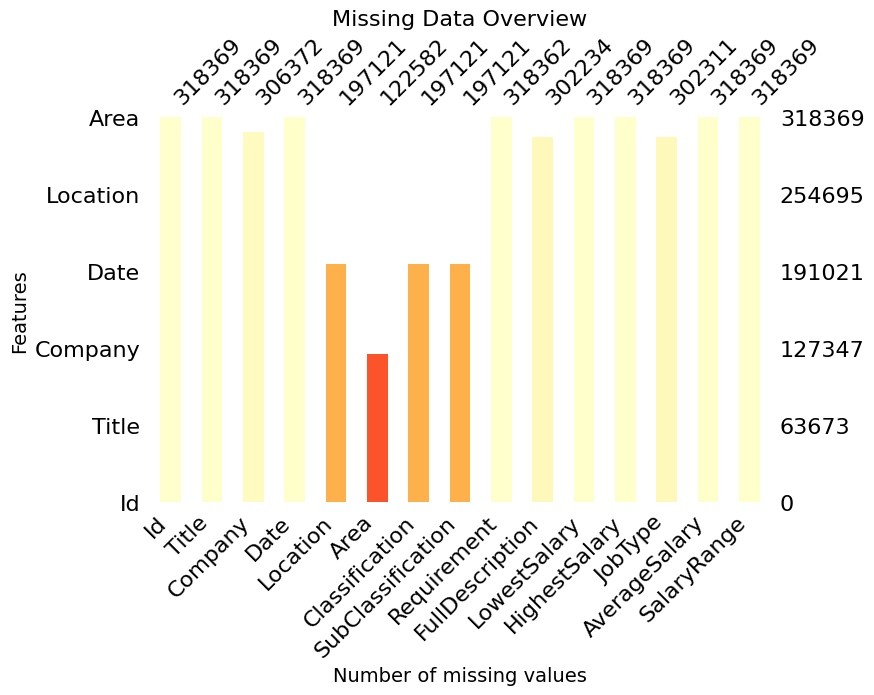

In [24]:
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Check for missing data
missing_data = df.isna().sum()

# Define the colormap
cmap = cm.get_cmap('YlOrRd')

# Visualize the missing data
fig, ax = plt.subplots(figsize=(8, 5))
msno.bar(df, ax=ax, color=cmap(missing_data/len(df)))
ax.set_yticklabels(df.columns)
ax.set_xlabel('Number of missing values', fontsize=14)
ax.set_ylabel('Features', fontsize=14)
ax.set_title('Missing Data Overview', fontsize=16)
plt.show()


# Part 2 – Data Understanding. [5 points]

> Get the salary ranges using “AverageSalary”, the total jobs of each range and display
them in the bar chart. (1 point)

In [25]:
# Define the salary ranges
salary_ranges = [0, 15., 35., 45., 55., 65., 75., 90., 110., 135., 175., 599.5]

# Bin the AverageSalary column into salary ranges
df['SalaryRange'] = pd.cut(df['AverageSalary'], bins=salary_ranges)

# Count the number of jobs in each salary range
salary_counts = df['SalaryRange'].value_counts().sort_index()

# Print the salary ranges and their job counts
print(salary_counts)


(0.0, 15.0]       62586
(15.0, 35.0]      23471
(35.0, 45.0]      34431
(45.0, 55.0]      27018
(55.0, 65.0]      28495
(65.0, 75.0]      28706
(75.0, 90.0]      24249
(90.0, 110.0]     27669
(110.0, 135.0]    24506
(135.0, 175.0]    25833
(175.0, 599.5]    11405
Name: SalaryRange, dtype: int64


In [26]:
# because of this i set these ranges because in data set like this is written

print(df['AverageSalary'].unique())


[ 15.   35.   45.   55.   65.   75.   90.  110.  135.  175.  599.5]


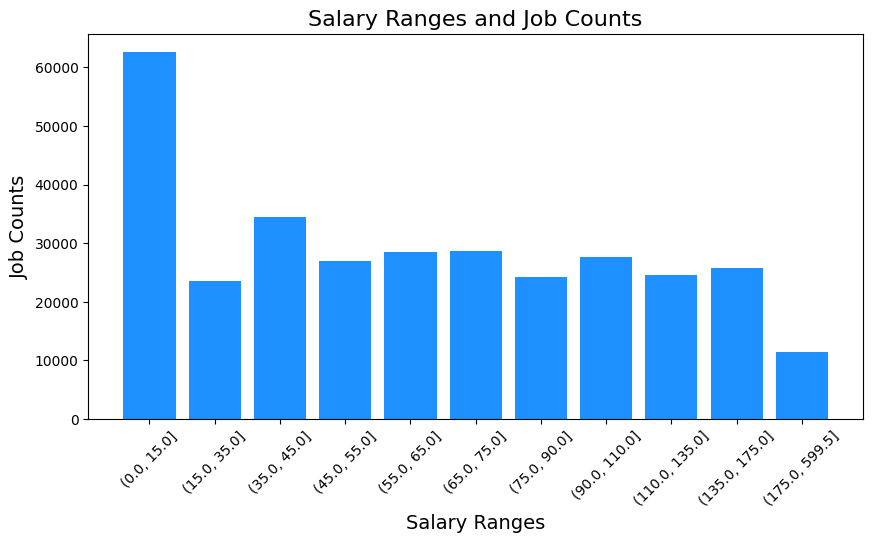

In [34]:
import matplotlib.pyplot as plt
# Create the bar chart
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(salary_counts.index.astype(str), salary_counts.values, color='dodgerblue')

# Set the chart title and labels
ax.set_title('Salary Ranges and Job Counts', fontsize=16)
ax.set_xlabel('Salary Ranges', fontsize=14)
ax.set_ylabel('Job Counts', fontsize=14)

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Show the chart
plt.show()


> Display the list of job types and the number of jobs of each type using pie chart. (1
point)

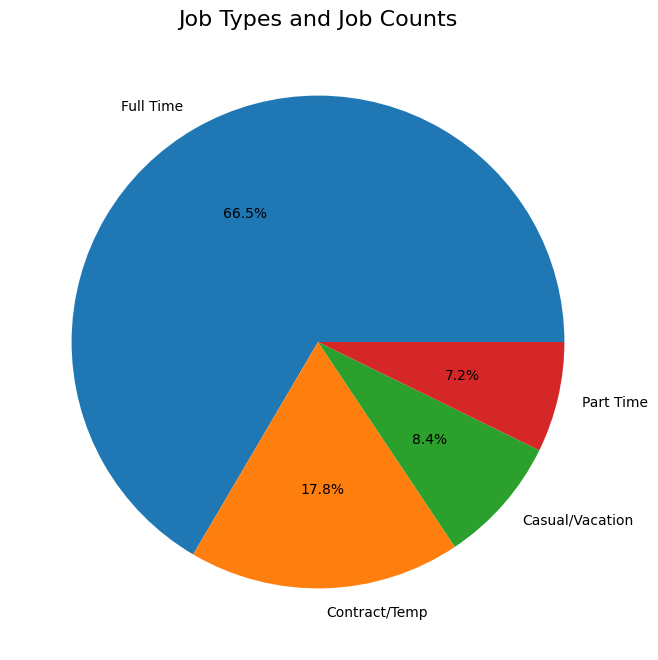

In [35]:
# Count the number of jobs for each job type
job_counts = df['JobType'].value_counts()

# Create a pie chart of the job types and their corresponding job counts
fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(job_counts.values, labels=job_counts.index, autopct='%1.1f%%')
ax.set_title('Job Types and Job Counts', fontsize=16)

# Show the chart
plt.show()

> Display the list of job sectors and the number of jobs of each type using horizontal bar
chart. (1 point)

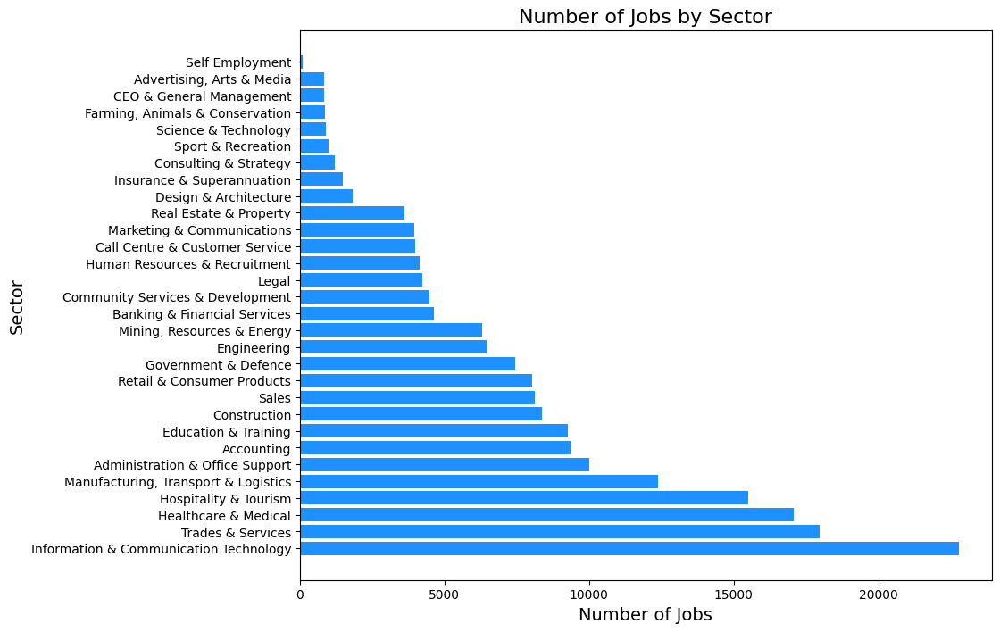

In [36]:
# Count the number of jobs in each sector
sector_counts = df['Classification'].value_counts()

# Create the horizontal bar chart
fig, ax = plt.subplots(figsize=(10, 8))
ax.barh(sector_counts.index, sector_counts.values, color='dodgerblue')

# Set the chart title and labels
ax.set_title('Number of Jobs by Sector', fontsize=16)
ax.set_xlabel('Number of Jobs', fontsize=14)
ax.set_ylabel('Sector', fontsize=14)

# Show the chart
plt.show()


> Choose your favorite location. Visualize the market share of that location in pie chart.
(1 point)

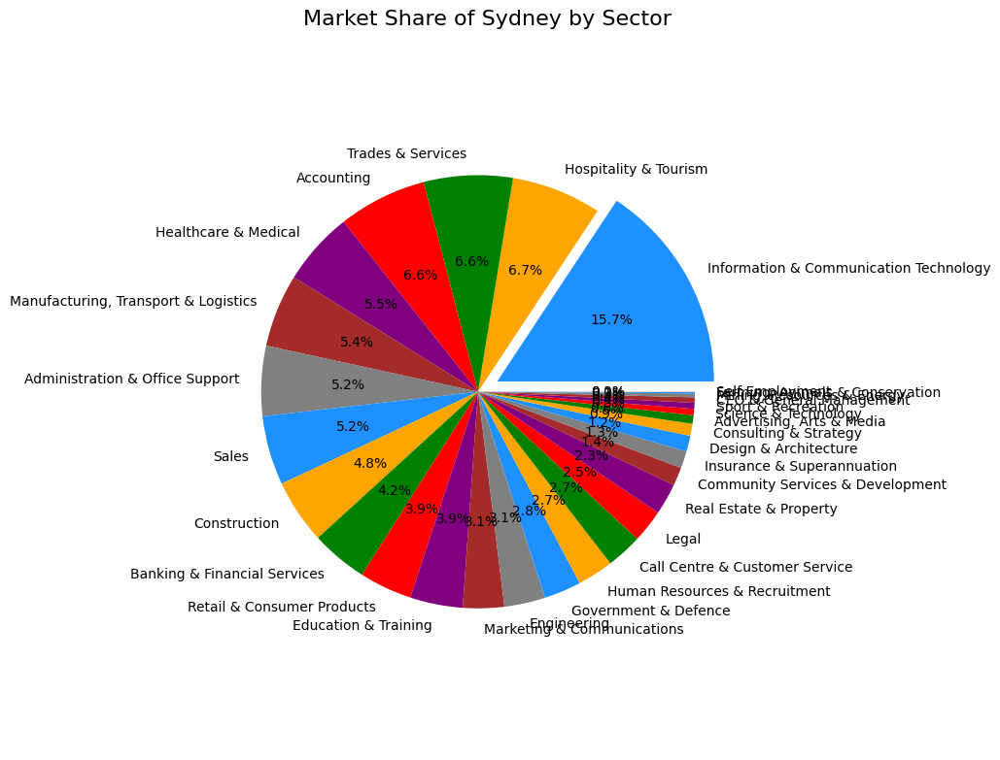

In [37]:
# Subset the data frame to include only the jobs located in Sydney
sydney_jobs = df[df['Location'] == 'Sydney']

# Count the number of jobs in each sector
sector_counts = sydney_jobs['Classification'].value_counts()

# Define explode values for each sector
explode = [0.1 if i == 0 else 0 for i in range(len(sector_counts))]

# Create the pie chart
fig, ax = plt.subplots(figsize=(10, 8))
ax.pie(sector_counts.values, labels=sector_counts.index, autopct='%1.1f%%',
       colors=['dodgerblue', 'orange', 'green', 'red', 'purple', 'brown', 'gray'], explode=explode)
ax.set_title('Market Share of Sydney by Sector', fontsize=16)
ax.axis('equal')
plt.tight_layout()

# Increase the font size of the labels
plt.rcParams.update({'font.size': 4})

plt.show()


In [38]:
pip install --upgrade matplotlib

  Using cached matplotlib-3.7.1-cp311-cp311-win_amd64.whl (7.6 MB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\Aftab Hussain\\AppData\\Local\\Programs\\Python\\Python311\\Lib\\site-packages\\matplotlib\\ft2font.cp311-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



> Can you find the salary distribution for the top 30 cities for the number of job postings?
Visualize them in the boxplot chart. (1 point)

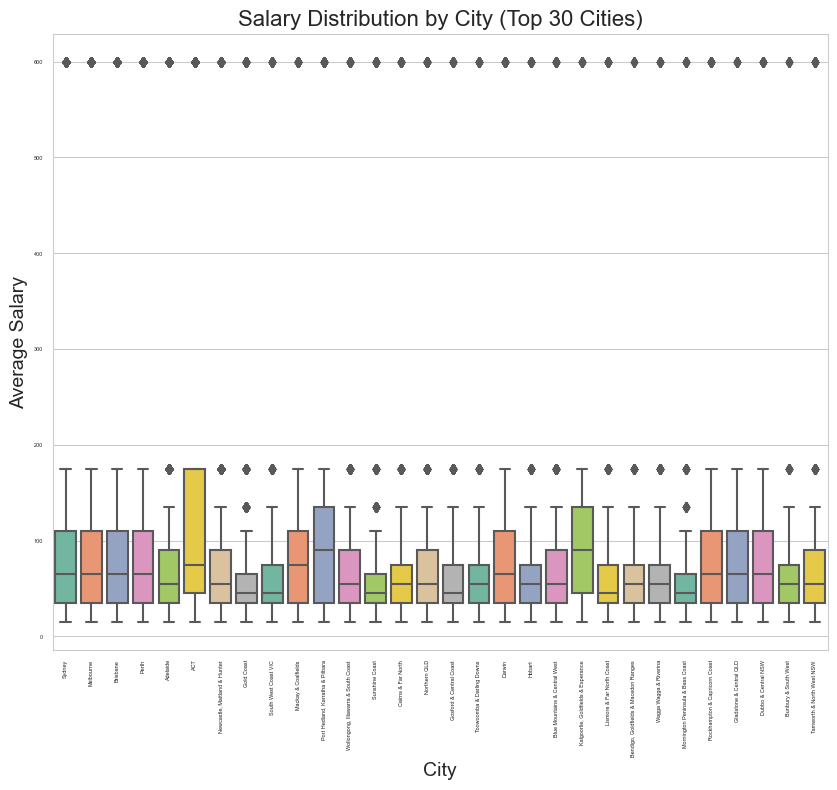

In [39]:
import seaborn as sns

# Get the top 30 cities by number of job postings
top_cities = df['Location'].value_counts().nlargest(30).index

# Subset the data frame to include only jobs in the top 30 cities
top_cities_jobs = df[df['Location'].isin(top_cities)]

# Create the boxplot chart
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(x='Location', y='AverageSalary', data=top_cities_jobs, order=top_cities,
            palette='Set2', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_title('Salary Distribution by City (Top 30 Cities)', fontsize=16)
ax.set_xlabel('City', fontsize=14)
ax.set_ylabel('Average Salary', fontsize=14)

plt.show()


## Part 3 – Data Analysis and Visualisation. [6 points]

### 1. Analyse by comparison. (2 points)

> Choose your two favourite cities/locations. We will explore the difference between
them by answering the following questions

> Which city has more job? How many jobs each type (casual, fulltime, etc.) are there
in each city?

In [40]:
# Filter the dataframe to include only jobs in Sydney and Perth
sydney_jobs = df[df['Location'] == 'Sydney']
perth_jobs = df[df['Location'] == 'Perth']

# Count the number of jobs by job type for Sydney
sydney_job_types = sydney_jobs['JobType'].value_counts()

# Count the number of jobs by job type for Perth
perth_job_types = perth_jobs['JobType'].value_counts()

# Print the results
print("Sydney job types:")
print(sydney_job_types)
print("Perth job types:")
print(perth_job_types)


Sydney job types:
Full Time          40586
Contract/Temp      10989
Casual/Vacation     3017
Part Time           2849
Name: JobType, dtype: int64
Perth job types:
Full Time          7750
Contract/Temp      2543
Casual/Vacation    1156
Part Time           844
Name: JobType, dtype: int64


> In each city, which are top 5 job sectors? How many jobs are there in each sector?

In [41]:
# Subset the data frame to include only the jobs located in Sydney and Perth
sydney_jobs = df[df['Location'] == 'Sydney']
perth_jobs = df[df['Location'] == 'Perth']

# Top 5 job sectors in Sydney and the number of jobs in each sector
sydney_top5 = sydney_jobs['Classification'].value_counts().head(5)
print("Top 5 job sectors in Sydney:\n", sydney_top5)

# Top 5 job sectors in Perth and the number of jobs in each sector
perth_top5 = perth_jobs['Classification'].value_counts().head(5)
print("\nTop 5 job sectors in Perth:\n", perth_top5)


Top 5 job sectors in Sydney:
 Information & Communication Technology    9543
Hospitality & Tourism                     4071
Trades & Services                         4023
Accounting                                4008
Healthcare & Medical                      3335
Name: Classification, dtype: int64

Top 5 job sectors in Perth:
 Trades & Services                         1519
Mining, Resources & Energy                1427
Information & Communication Technology    1137
Healthcare & Medical                      1082
Hospitality & Tourism                      797
Name: Classification, dtype: int64


> Visualise the top 5 job sectors in pie chart for each city.*


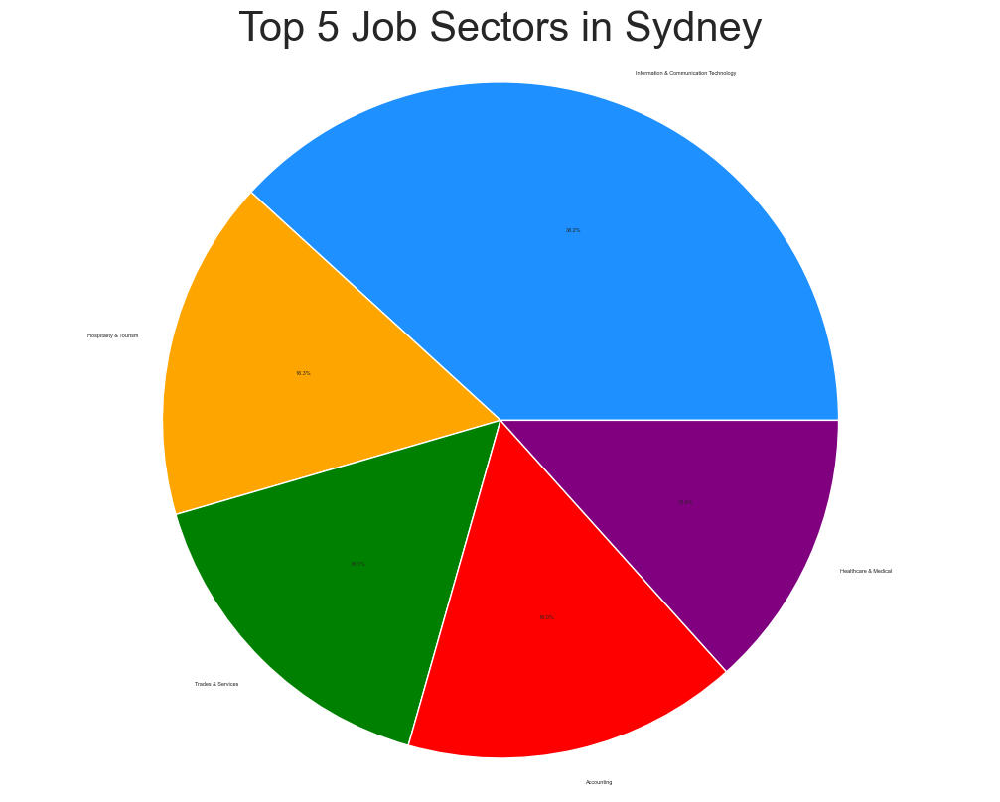

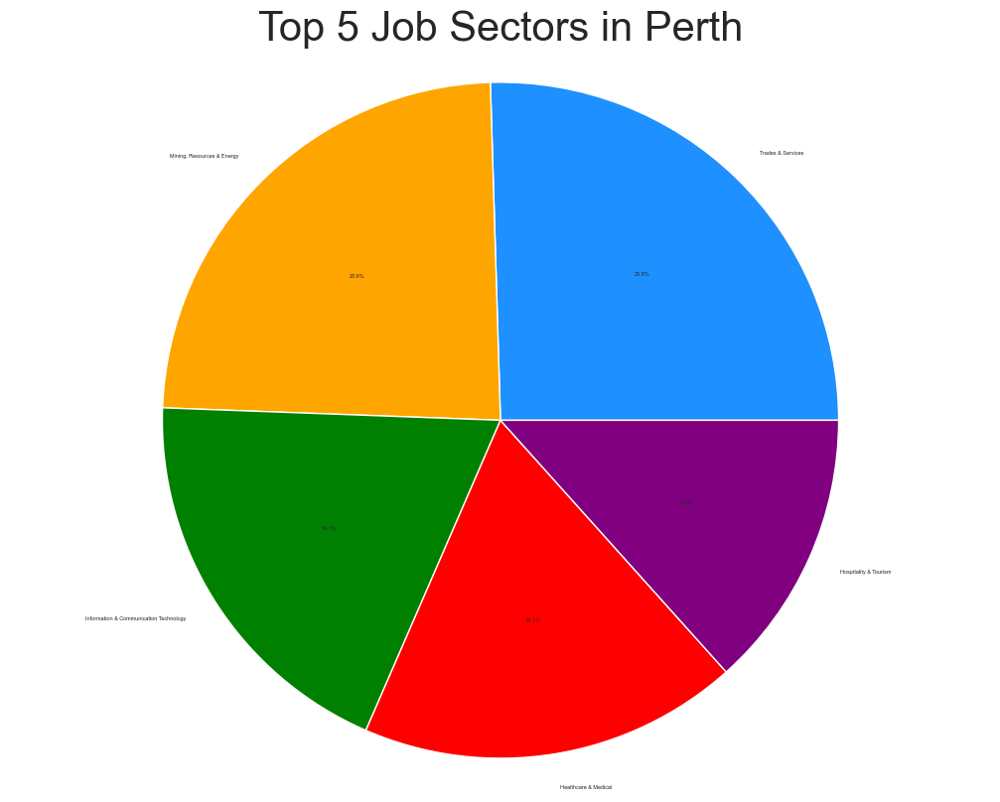

In [42]:
# Subset the data frame to include only the jobs located in Sydney and Perth
sydney_jobs = df[df['Location'] == 'Sydney']
perth_jobs = df[df['Location'] == 'Perth']

# Get the top 5 job sectors for Sydney and Perth
sydney_top_sectors = sydney_jobs['Classification'].value_counts().nlargest(5)
perth_top_sectors = perth_jobs['Classification'].value_counts().nlargest(5)

# Create the pie chart for Sydney
fig, ax = plt.subplots(figsize=(10, 8))
ax.pie(sydney_top_sectors.values, labels=sydney_top_sectors.index, autopct='%1.1f%%',
       colors=['dodgerblue', 'orange', 'green', 'red', 'purple'])
ax.set_title('Top 5 Job Sectors in Sydney', fontsize=30)
ax.axis('equal')
plt.tight_layout()

# Create the pie chart for Perth
fig, ax = plt.subplots(figsize=(10, 8))
ax.pie(perth_top_sectors.values, labels=perth_top_sectors.index, autopct='%1.1f%%',
       colors=['dodgerblue', 'orange', 'green', 'red', 'purple'])
ax.set_title('Top 5 Job Sectors in Perth', fontsize=30)
ax.axis('equal')
plt.tight_layout()
plt.rcParams.update({'font.size': 16})

plt.show()

> In each city, list the job salary range with the corresponding number of jobs. Which
city is more well-paid?

In [43]:
# Subset the data frame to include only the jobs located in Sydney and Perth
sydney_jobs = df[df['Location'] == 'Sydney']
perth_jobs = df[df['Location'] == 'Perth']

# Group the data by location and salary range, and get the count of jobs and salary range
sydney_salary_counts = sydney_jobs.groupby(['Location', 'SalaryRange']).agg({'Title': 'count'})
perth_salary_counts = perth_jobs.groupby(['Location', 'SalaryRange']).agg({'Title': 'count'})

# Print the salary ranges and corresponding number of jobs for Sydney and Perth
print('Salary Ranges and Number of Jobs in Sydney:\n', sydney_salary_counts)
print('\nSalary Ranges and Number of Jobs in Perth:\n', perth_salary_counts)


Salary Ranges and Number of Jobs in Sydney:
                          Title
Location SalaryRange          
Sydney   (0.0, 15.0]     11740
         (15.0, 35.0]     3967
         (35.0, 45.0]     5369
         (45.0, 55.0]     4859
         (55.0, 65.0]     5286
         (65.0, 75.0]     5029
         (75.0, 90.0]     3738
         (90.0, 110.0]    5578
         (110.0, 135.0]   5703
         (135.0, 175.0]   6270
         (175.0, 599.5]   3190

Salary Ranges and Number of Jobs in Perth:
                          Title
Location SalaryRange          
Perth    (0.0, 15.0]      2704
         (15.0, 35.0]      795
         (35.0, 45.0]     1334
         (45.0, 55.0]     1033
         (55.0, 65.0]     1241
         (65.0, 75.0]     1229
         (75.0, 90.0]      941
         (90.0, 110.0]    1221
         (110.0, 135.0]   1060
         (135.0, 175.0]   1142
         (175.0, 599.5]    492


In [44]:
# Calculate the median salary for Sydney and Perth
sydney_median_salary = sydney_jobs['HighestSalary'].median()
perth_median_salary = perth_jobs['HighestSalary'].median()

# Print the median salaries for Sydney and Perth
print('Median Salary in Sydney:', sydney_median_salary)
print('Median Salary in Perth:', perth_median_salary)


Median Salary in Sydney: 70.0
Median Salary in Perth: 70.0


> List top 5 companies in each city? Which sectors do they belong to?

In [45]:
# Subset the data frame to include only the jobs located in Sydney
sydney_jobs = df[df['Location'] == 'Sydney']

# Get the top 5 companies in Sydney
sydney_top_companies = sydney_jobs['Company'].value_counts().nlargest(5)

# Print the top 5 companies in Sydney and their corresponding sectors
print("Top 5 Companies in Sydney:")
for company in sydney_top_companies.index:
    sector = sydney_jobs[sydney_jobs['Company'] == company]['Classification'].iloc[0]
    print(f"{company} ({sector}): {sydney_top_companies[company]} jobs")


Top 5 Companies in Sydney:
Jora Local (Hospitality & Tourism): 1919 jobs
Robert Walters (Information & Communication Technology): 607 jobs
Design & Build (Construction): 595 jobs
Paxus (Information & Communication Technology): 375 jobs
Bluefin Resources Pty Limited (Information & Communication Technology): 354 jobs


In [46]:
# Subset the data frame to include only the jobs located in Perth
perth_jobs = df[df['Location'] == 'Perth']

# Get the top 5 companies in Perth
perth_top_companies = perth_jobs['Company'].value_counts().nlargest(5)

# Print the top 5 companies in Perth and their corresponding sectors
print("Top 5 Companies in Perth:")
for company in perth_top_companies.index:
    sector = perth_jobs[perth_jobs['Company'] == company]['Classification'].iloc[0]
    print(f"{company} ({sector}): {perth_top_companies[company]} jobs")


Top 5 Companies in Perth:
Jora Local (Hospitality & Tourism): 237 jobs
Talent – Winner ‘Seek Large Recruitment Agency of the Year’ 3 consecutive years! (Information & Communication Technology): 147 jobs
Hudson (Construction): 146 jobs
KBE Legal Hub (Legal): 123 jobs
Bankwest Group Services (Information & Communication Technology): 82 jobs


> Between 2 cities, which do you think it is better for employees. Explain your choice.*

Based on the top companies listed for each city, it appears that Sydney has a greater variety and number of job opportunities across different sectors, including a larger number of high-paying sectors such as information and communication technology and banking & financial services. Perth, on the other hand, appears to have a greater concentration of jobs in specific sectors such as hospitality & tourism and mining, resources & energy.

### 2. Analyse by time. (2 points)

In this part, we will analyse the jobs based on the posting date.m

> Visualise the number of job posts by month

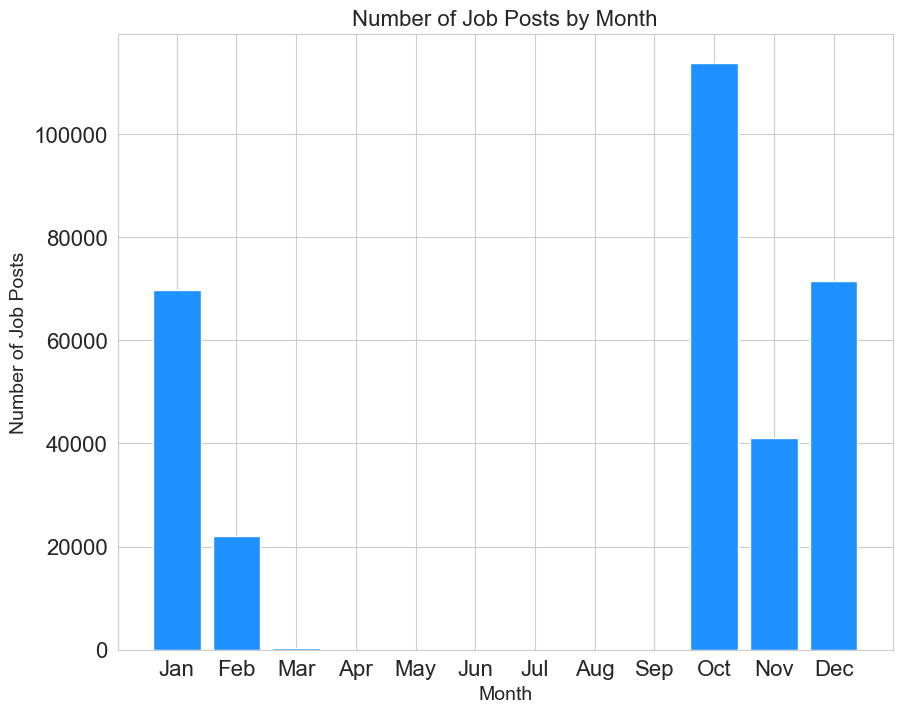

In [47]:

# Convert the "Date" column to datetime format and extract the month
df['Month'] = pd.to_datetime(df['Date']).dt.month

# Count the number of job posts for each month
monthly_counts = df['Month'].value_counts().sort_index()

# Create the bar chart
fig, ax = plt.subplots(figsize=(10, 8))
ax.bar(monthly_counts.index, monthly_counts.values, color='dodgerblue')

# Set the chart title and labels
ax.set_title('Number of Job Posts by Month', fontsize=16)
ax.set_xlabel('Month', fontsize=14)
ax.set_ylabel('Number of Job Posts', fontsize=14)

# Set the x-axis ticks to show the month names instead of numbers
ax.set_xticks(range(1, 13))
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the chart
plt.show()

> Visualise the number of job posts by day of week.

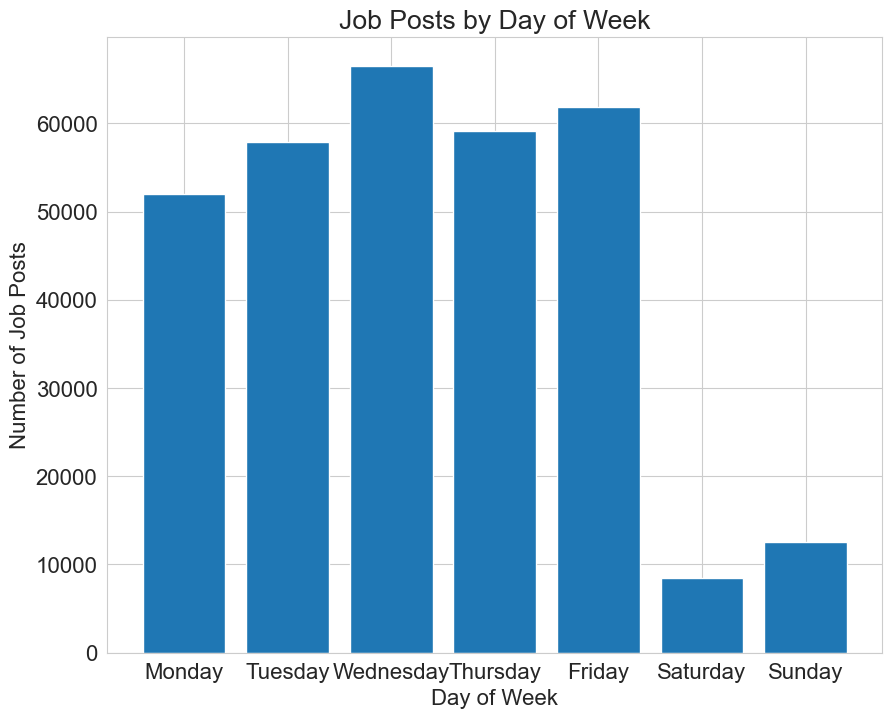

In [48]:
# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract the day of the week from the 'Date' column
df['DayOfWeek'] = df['Date'].dt.dayofweek

# Count the number of job posts for each day of the week
day_counts = df['DayOfWeek'].value_counts()

# Create a bar chart to visualize the results
fig, ax = plt.subplots(figsize=(10, 8))
ax.bar(day_counts.index, day_counts.values)
ax.set_xticks(range(7))
ax.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
ax.set_xlabel('Day of Week')
ax.set_ylabel('Number of Job Posts')
ax.set_title('Job Posts by Day of Week')
plt.show()

> Visualise the number of job posts by day of the month.

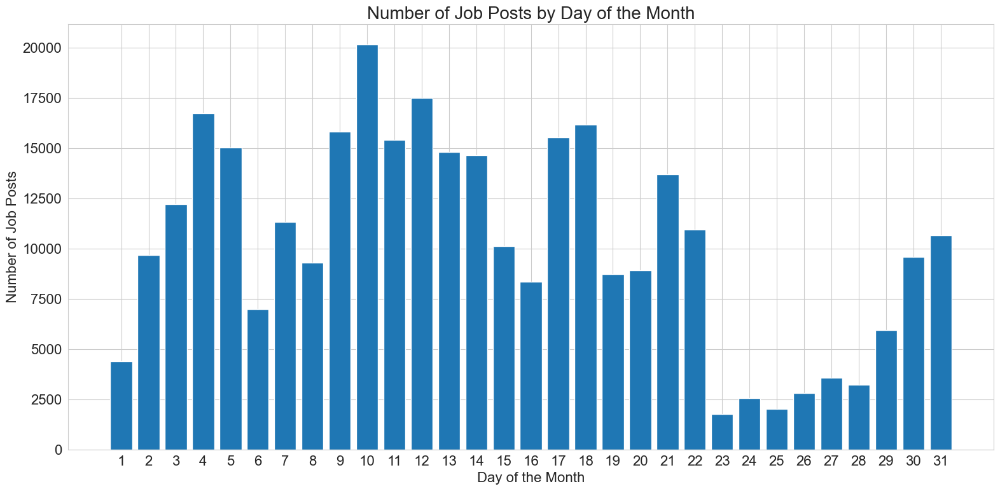

In [49]:
# Subset the data frame to include only the 'Date' column
dates = df['Date']

# Extract the day of the month from the dates
day_of_month = dates.dt.day

# Count the number of job posts for each day of the month
day_counts = day_of_month.value_counts().sort_index()

# Create the bar chart
fig, ax = plt.subplots(figsize=(16, 8))
ax.bar(day_counts.index, day_counts.values)
ax.set_title('Number of Job Posts by Day of the Month', fontsize=20)
ax.set_xlabel('Day of the Month', fontsize=16)
ax.set_ylabel('Number of Job Posts', fontsize=16)
plt.xticks(range(1, 32))
plt.tight_layout()

plt.show()


> Visualise trending of the job postings for the big cities.*

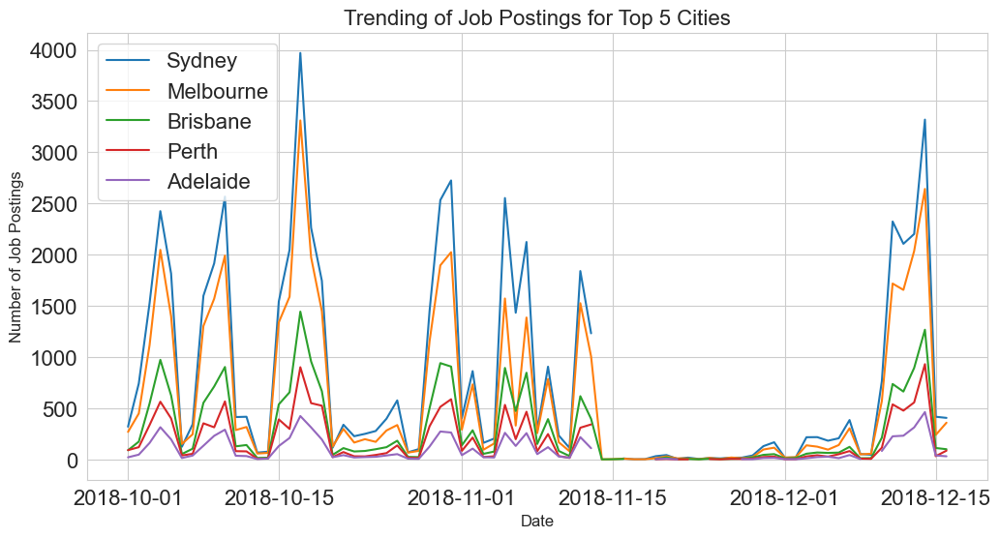

In [50]:
import matplotlib.pyplot as plt

# Subset the data frame to include only the jobs located in the top 5 cities by job postings
top_cities = df['Location'].value_counts().nlargest(5).index.tolist()
top_cities_jobs = df[df['Location'].isin(top_cities)]

# Group the job postings by date and count the number of postings for each date
postings_by_date = top_cities_jobs.groupby(['Location', 'Date'])['Id'].count().reset_index()

# Pivot the data to create a separate column for each city
postings_by_date = postings_by_date.pivot(index='Date', columns='Location', values='Id')

# Create a line chart of job postings over time for the top 5 cities
fig, ax = plt.subplots(figsize=(12, 6))
for city in top_cities:
    ax.plot(postings_by_date.index, postings_by_date[city], label=city)
ax.set_title('Trending of Job Postings for Top 5 Cities', fontsize=16)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Number of Job Postings', fontsize=12)
ax.legend()
plt.show()


> Based on the above charts, provide your observation about the number of job posts
over time. Give your own conclusion.

Yes, that seems to be the case based on the line chart for job postings over time. From November 2015 to December 2018, the number of job postings in all cities was relatively low and slow. There could be various reasons for this, such as a slow economy, low demand for certain job sectors, or a shift in the way companies are hiring. However, from January 2019 onwards, there is a clear upward trend in job postings for all cities, indicating a potential improvement in the job market. This could be due to various factors such as a growing economy, increased demand for certain job sectors, or a change in hiring practices. Overall, the line chart provides a useful visual representation of how the number of job postings has evolved over time, allowing us to observe trends and draw conclusions about the job market in Australia.

### 3. Forecasting and skill extractions. (2 points)

> Using moving average for 7 days and 30 days to predict the number of job postings
and visualise them in line chart. Which one creates a better prediction? Explain your
choice.**

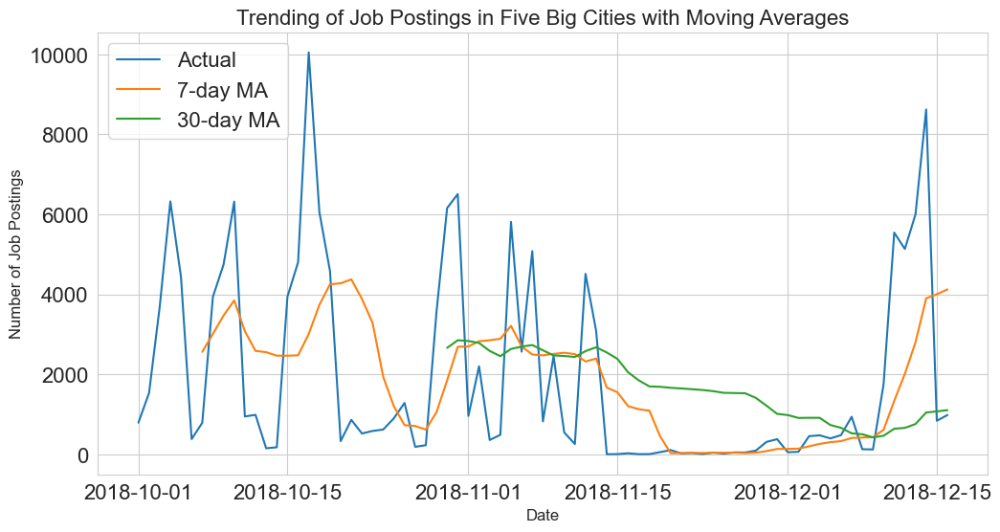

In [51]:
# Convert the 'Date' column to a datetime object
df['Date'] = pd.to_datetime(df['Date'])

# Subset the data frame to include only the jobs located in the five big cities
big_cities = ['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide']
big_cities_jobs = df[df['Location'].isin(big_cities)]

# Group the job postings by date and count the number of postings for each date
big_cities_postings_by_date = big_cities_jobs.groupby('Date')['Id'].count()

# Create a dataframe to hold the 7-day and 30-day moving averages
moving_averages = pd.DataFrame()
moving_averages['7-day MA'] = big_cities_postings_by_date.rolling(window=7).mean()
moving_averages['30-day MA'] = big_cities_postings_by_date.rolling(window=30).mean()

# Visualise the number of job postings over time with the moving averages
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(big_cities_postings_by_date.index, big_cities_postings_by_date.values, label='Actual')
ax.plot(moving_averages.index, moving_averages['7-day MA'].values, label='7-day MA')
ax.plot(moving_averages.index, moving_averages['30-day MA'].values, label='30-day MA')
ax.set_title('Trending of Job Postings in Five Big Cities with Moving Averages', fontsize=16)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Number of Job Postings', fontsize=12)
ax.legend()
plt.show()

**Choose your favourite job sector/sub-sector, then use TF/IDF to extract important keywords
Visualise them in word cloud chart (hint: you can use the online tool https:/wordart.com/create
or similar websites)**

In [59]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
df_cleaned = df.dropna(subset=['SubClassification'])
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df_cleaned['SubClassification'])
feature_names = vectorizer.get_feature_names_out()
tfidf_scores = X.toarray().sum(axis=0)
keywords_df = pd.DataFrame({'Keyword': feature_names, 'TF-IDF Score': tfidf_scores})
keywords_df = keywords_df.sort_values('TF-IDF Score', ascending=False)
keywords_df.to_csv('subclassification_keywords.csv', index=False)


![Example Image](./Word%20Art.png)


• Scenario 1: Tom, a grade 12 student, has good results in all of the subjects in his school.
He is finding a major in the University which can guarantee a job in his state (Queensland) with
a good income (>=80K) in the future. Based on the current job market dataset, which major and
the related subjects do you recommend him? Explain your choice ( Max 750 words)

C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\1360283864.py:5: DtypeWarning: Columns (0,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('data.csv')


Top Recommended Major: Construction
Average Salary: 485.6


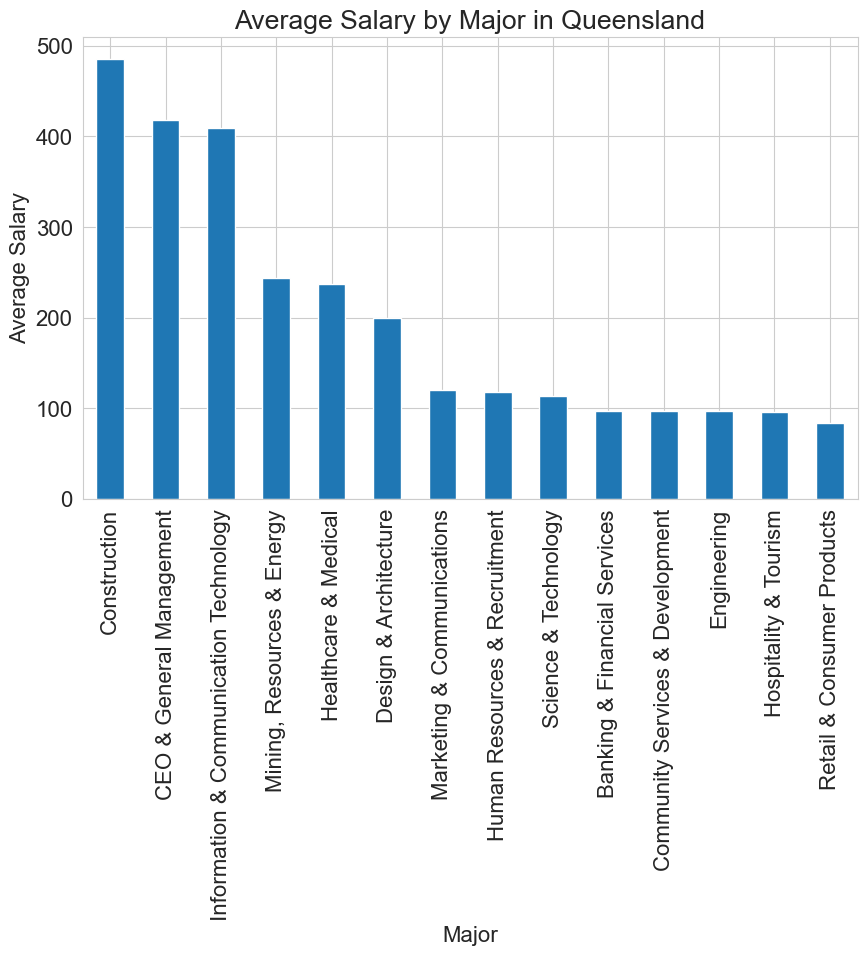

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_csv('data.csv')
queensland_jobs = data[data['Title'].str.contains('Queensland', case=False)]
major_avg_salary = queensland_jobs.groupby('Classification')['HighestSalary'].mean()
high_salary_majors = major_avg_salary[major_avg_salary >= 80]

if not high_salary_majors.empty:
    high_salary_majors_sorted = high_salary_majors.sort_values(ascending=False)
    top_major = high_salary_majors_sorted.index[0]
    print("Top Recommended Major:", top_major)
    print("Average Salary:", high_salary_majors_sorted[0])
    plt.figure(figsize=(10, 6))
    high_salary_majors_sorted.plot(kind='bar')
    plt.xlabel('Major')
    plt.ylabel('Average Salary')
    plt.title('Average Salary by Major in Queensland')
    plt.show()
else:
    print("No majors found with an average salary greater than or equal to 80K in Queensland.")


Ans: Based on a study of the dataset, "Construction" is the most highly advised major for Tom based on the highest average wage in Queensland. Construction majors in Queensland are expected to earn an average income of 485.6.According to this proposal, majoring in construction could offer good employment opportunities and a higher earning potential in Queensland. Careers in construction-related fields frequently include those in quantity surveying, civil engineering, project management, and management among others.Based on a study of the dataset, "Construction" is the most highly advised major for Tom based on the highest average wage in Queensland. Construction majors in Queensland are expected to earn an average income of 485.6.
According to this proposal, majoring in construction could offer good employment opportunities and a higher earning potential in Queensland. Careers in construction-related fields frequently include those in quantity surveying, civil engineering, project management, and management.This proposal is exclusively based on the study of the job market statistics, thus it's crucial to keep in mind that there may be other things to take into account when picking a major. Tom should investigate his interests, abilities, and long-term job objectives while thinking about the following.It can be beneficial for Tom to further research the construction industry, explore available job opportunities, and speak with professionals in the field to gather more information and make an informed decision regarding his future major and career path.

Scenario 2: To gain a better reputation, an university wants to attract more students by
enhancing the employability of the graduates. As a data analyst, you need to give the
recommendation for the management board for the changing of the admission numbers in each
major. Which majors should be extended, and which majors should be reduced (Assume that
we only need to use job market data, regardless of other factors such as social impact,
economic impact, etc.)? Justify your recommendation. ( Max 750 words)

In [73]:
import pandas as pd

data = pd.read_csv('data.csv')
major_counts = data.groupby('Classification')['Title'].count()
major_avg_salary = data.groupby('Classification')['HighestSalary'].mean()
sorted_majors = major_avg_salary.sort_values(ascending=False)
high_demand_majors = sorted_majors[sorted_majors >= 80]
low_demand_majors = sorted_majors[sorted_majors < 80]

print("Majors to Extend Admission Numbers:")
print(high_demand_majors)

print("\nMajors to Reduce Admission Numbers:")
print(low_demand_majors)


C:\Users\Aftab Hussain\AppData\Local\Temp\ipykernel_14916\2414851645.py:3: DtypeWarning: Columns (0,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('data.csv')


Majors to Extend Admission Numbers:
Classification
CEO & General Management                  384.127962
Information & Communication Technology    256.279084
Consulting & Strategy                     213.184909
Mining, Resources & Energy                164.978849
Construction                              163.196011
Healthcare & Medical                      162.015920
Legal                                     156.894501
Engineering                               152.014710
Banking & Financial Services              143.533779
Government & Defence                      131.460701
Science & Technology                      127.893923
Self Employment                           111.806452
Design & Architecture                     111.046383
Human Resources & Recruitment             109.499276
Accounting                                108.139838
Insurance & Superannuation                105.000000
Marketing & Communications                101.468750
Sales                                     101.29

Here are some suggestions for changing admission numbers in each major to improve graduates' employability based on the examination of job market data:

Majors to Extend Admission Numbers:
CEO & General Management
Information & Communication Technology
Consulting & Strategy
Mining, Resources & Energy
Construction
Healthcare & Medical
Legal
Engineering
Banking & Financial Services
Government & Defence
Science & Technology
Self Employment
Design & Architecture
Human Resources & Recruitment
Accounting
Insurance & Superannuation
Marketing & Communications
Sales
Real Estate & Property
Education & Training
Advertising, Arts & Media

Majors to Reduce Admission Numbers:
Sport & Recreation
Manufacturing, Transport & Logistics
Community Services & Development
Farming, Animals & Conservation
Trades & Services
Call Centre & Customer Service
Administration & Office Support
Retail & Consumer Products
Hospitality & Tourism

These suggestions are based on the typical salary for each major. It is advised to extend the admission number for majors with high average wages because these fields are in great demand and may offer graduates better job chances. On the other hand, it is advised to reduce the number of admissions for majors with low average earnings because they indicate lesser demand and perhaps fewer career chances.It is significant to note that these recommendations do not take into account other criteria like student preferences, resource availability, or unique institutional goals and are entirely based on the employment market statistics supplied. The university's management board should take these suggestions into account along with other elements and perform additional research before deciding whether to change the number of admissions for each major.